# Load DataSet

In [ ]:
# Step 1: Import required libraries
import torch
import torch.nn as nn
import torch.nn.functional as F
import timm
import time
import numpy as np
import matplotlib.pyplot as plt
from torch import optim
from torch.utils.data import DataLoader, random_split
from torchvision import datasets, transforms
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns

# Path to your dataset
data_dir = '/kaggle/input/maizdataset/maizdataset'

# Step 2: Set up data transformations
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Load the dataset and split into training and validation sets
dataset = datasets.ImageFolder(root=data_dir, transform=transform)

# Splitting dataset into training and validation sets
train_size = int(0.8 * len(dataset))
val_size = len(dataset) - train_size
train_dataset, val_dataset = random_split(dataset, [train_size, val_size])

# Create data loaders
batch_size = 64
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=4, pin_memory=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=4, pin_memory=True)

# Print class names to verify
print("Classes:", dataset.classes)

# Step 4: Instantiate pre-trained MobileViT and DaViT models from timm
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

Classes: ['HEATHLY', 'MLN_1_and_MLN_2', 'MSV_1', 'MSV_2']


In [ ]:
val_loader

# Building Hybride Model

- Fusion of MobileVit & Davit

In [ ]:
class EnsembleModel(nn.Module):
    def __init__(self, mobilevit, davit, num_classes):
        super(EnsembleModel, self).__init__()
        self.mobilevit = mobilevit
        self.davit = davit
        self.fc1 = nn.Linear(num_classes * 2, 512)  # First fully connected hidden layer
        self.relu = nn.ReLU()  # Activation function
        self.dropout = nn.Dropout(p=0.5)  # Dropout layer to prevent overfitting
        self.fc2 = nn.Linear(512, num_classes)  # Final output layer

    def forward(self, x):
        out_mobilevit = self.mobilevit(x)
        out_davit = self.davit(x)
        out = torch.cat((out_mobilevit, out_davit), dim=1)
        out = self.fc1(out)
        out = self.relu(out)
        out = self.dropout(out)
        out = self.fc2(out)
        return out

# Load pre-trained MobileViT and fine-tune
mobilevit = timm.create_model('mobilevit_s', pretrained=True, num_classes=len(dataset.classes))
mobilevit = mobilevit.to(device)
for param in mobilevit.parameters():  # Fine-tuning: Unfreeze all layers
    param.requires_grad = True

# Load pre-trained DaViT and fine-tune
davit = timm.create_model('davit_small', pretrained=True, num_classes=len(dataset.classes))
davit = davit.to(device)
for param in davit.parameters():  # Fine-tuning: Unfreeze all layers
    param.requires_grad = True

# Create the ensemble model
ensemble_model = EnsembleModel(mobilevit, davit, num_classes=len(dataset.classes)).to(device)


model.safetensors:   0%|          | 0.00/22.4M [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/199M [00:00<?, ?B/s]

/opt/conda/lib/python3.10/site-packages/timm/models/_hub.py:190: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  return torch.load(cached_file, map_location='cpu')
/opt/conda/

In [ ]:
# Optimizer and loss function
optimizer = torch.optim.Adam(ensemble_model.parameters(), lr=0.0001, weight_decay=1e-5)  # Lower LR for fine-tuning
criterion = nn.CrossEntropyLoss()

# Learning rate scheduler for better optimization
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=5, verbose=True)

In [ ]:
# # Step 5: Define loss function and optimizer
# criterion = nn.CrossEntropyLoss()
# optimizer = optim.Adam(ensemble_model.parameters(), lr=1e-5)
# scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=5, verbose=True)


# Function to calculate GPU memory usage
def get_gpu_memory_usage():
    return torch.cuda.memory_allocated() / (1024 * 1024)  # in MB

# Training

In [ ]:
epochs = 30
train_losses, val_losses = [], []
train_accuracies, val_accuracies = [], []  # Corrected initialization
gpu_memory_usage = []
time_per_epoch = []


for epoch in range(epochs):
    start_time = time.time()

    # Training phase
    ensemble_model.train()
    running_loss, running_corrects, total_samples = 0, 0, 0
    for inputs, labels in train_loader:
        inputs, labels = inputs.to(device), labels.to(device)

        optimizer.zero_grad()
        outputs = ensemble_model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        # Accumulate metrics
        running_loss += loss.item() * inputs.size(0)
        _, preds = torch.max(outputs, 1)
        running_corrects += torch.sum(preds == labels).item()
        total_samples += labels.size(0)

    train_loss = running_loss / total_samples
    train_acc = running_corrects / total_samples
    train_losses.append(train_loss)
    train_accuracies.append(train_acc)

    # Validation phase
    ensemble_model.eval()
    val_running_loss, val_running_corrects, val_total_samples = 0, 0, 0
    with torch.no_grad():
        for inputs, labels in val_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = ensemble_model(inputs)
            loss = criterion(outputs, labels)

            # Accumulate metrics
            val_running_loss += loss.item() * inputs.size(0)
            _, preds = torch.max(outputs, 1)
            val_running_corrects += torch.sum(preds == labels).item()
            val_total_samples += labels.size(0)

    val_loss = val_running_loss / val_total_samples
    val_acc = val_running_corrects / val_total_samples
    val_losses.append(val_loss)
    val_accuracies.append(val_acc)

    # Measure GPU memory and time
    memory_gpu = get_gpu_memory_usage()
    gpu_memory_usage.append(memory_gpu)
    elapsed_time = time.time() - start_time
    time_per_epoch.append(elapsed_time)

    # Print progress for each epoch
    print(f"Epoch {epoch+1}/{epochs}, Train Loss: {train_loss:.4f}, Train Acc: {train_acc:.4f}, "
          f"Val Loss: {val_loss:.4f}, Val Acc: {val_acc:.4f}, GPU Memory: {memory_gpu:.2f} MB, Time: {elapsed_time:.2f}s")

Epoch 1/30, Train Loss: 0.2918, Train Acc: 0.8864, Val Loss: 0.1618, Val Acc: 0.9352, GPU Memory: 865.78 MB, Time: 636.75s
Epoch 2/30, Train Loss: 0.1622, Train Acc: 0.9382, Val Loss: 0.1756, Val Acc: 0.9306, GPU Memory: 865.78 MB, Time: 635.46s
Epoch 3/30, Train Loss: 0.1350, Train Acc: 0.9502, Val Loss: 0.1869, Val Acc: 0.9277, GPU Memory: 865.78 MB, Time: 635.70s
Epoch 4/30, Train Loss: 0.1131, Train Acc: 0.9589, Val Loss: 0.1612, Val Acc: 0.9388, GPU Memory: 865.78 MB, Time: 635.60s
Epoch 5/30, Train Loss: 0.0956, Train Acc: 0.9651, Val Loss: 0.1557, Val Acc: 0.9485, GPU Memory: 865.78 MB, Time: 635.66s
Epoch 6/30, Train Loss: 0.0639, Train Acc: 0.9779, Val Loss: 0.1818, Val Acc: 0.9365, GPU Memory: 865.78 MB, Time: 635.23s
Epoch 7/30, Train Loss: 0.0551, Train Acc: 0.9824, Val Loss: 0.1706, Val Acc: 0.9443, GPU Memory: 865.78 MB, Time: 635.15s
Epoch 8/30, Train Loss: 0.0402, Train Acc: 0.9857, Val Loss: 0.2171, Val Acc: 0.9362, GPU Memory: 865.78 MB, Time: 635.25s
Epoch 9/30, Trai

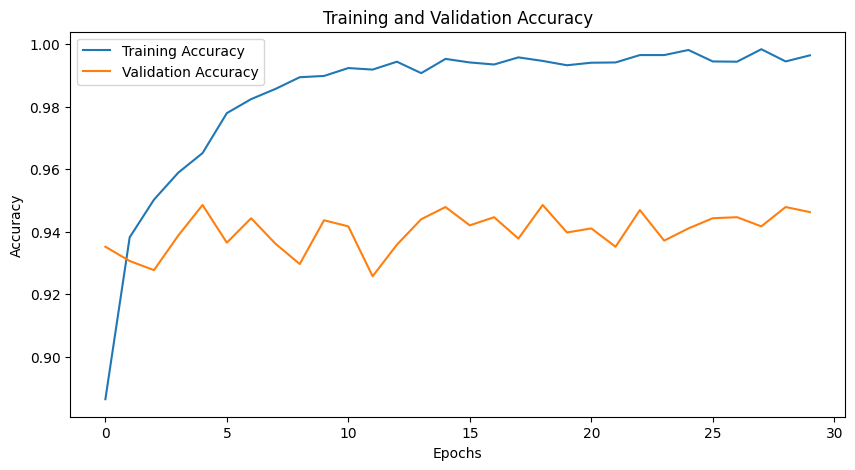

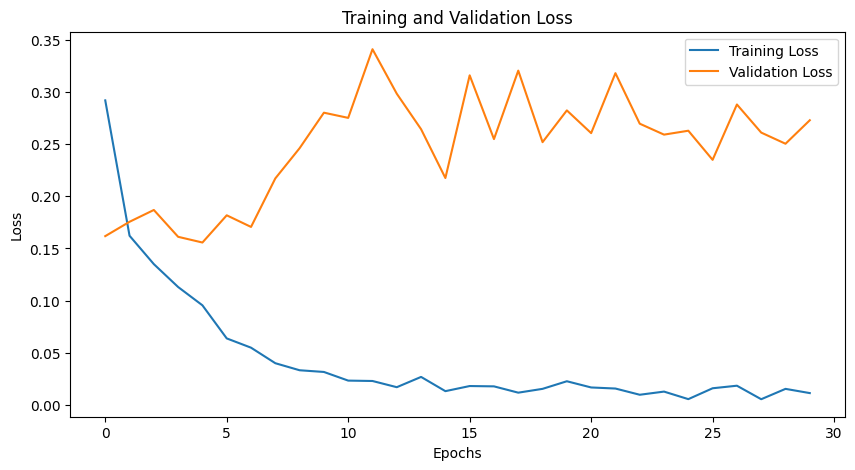

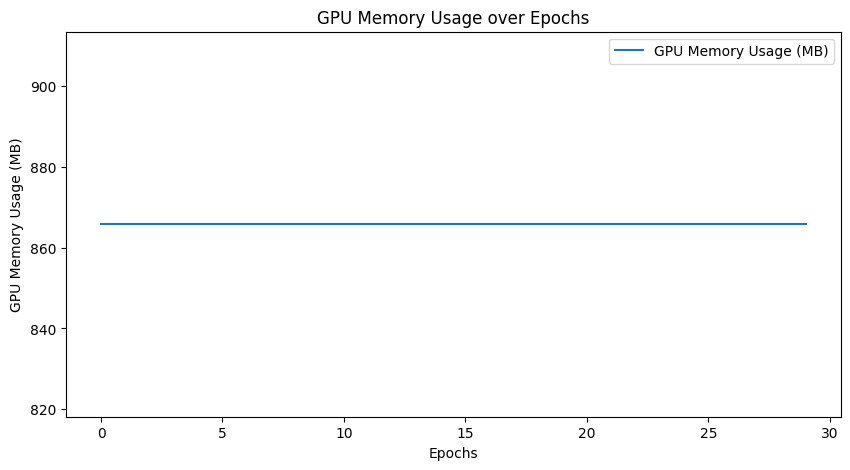

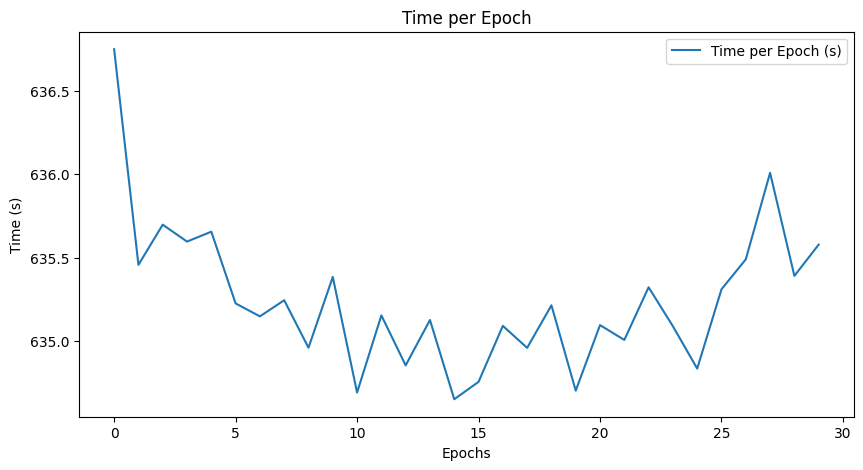

In [ ]:
# Plotting training and validation accuracy
plt.figure(figsize=(10, 5))
plt.plot(train_accuracies, label='Training Accuracy')
plt.plot(val_accuracies, label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()
plt.show()

# Plotting training and validation loss
plt.figure(figsize=(10, 5))
plt.plot(train_losses, label='Training Loss')
plt.plot(val_losses, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.show()

# Plot GPU Memory Usage per epoch
plt.figure(figsize=(10, 5))
plt.plot(gpu_memory_usage, label='GPU Memory Usage (MB)')
plt.xlabel('Epochs')
plt.ylabel('GPU Memory Usage (MB)')
plt.title('GPU Memory Usage over Epochs')
plt.legend()
plt.show()

# Plot time per epoch
plt.figure(figsize=(10, 5))
plt.plot(time_per_epoch, label='Time per Epoch (s)')
plt.xlabel('Epochs')
plt.ylabel('Time (s)')
plt.title('Time per Epoch')
plt.legend()
plt.show()

In [ ]:
# Classification report and confusion matrix on validation set
all_preds, all_labels = [], []
ensemble_model.eval()
with torch.no_grad():
    for inputs, labels in val_loader:
        inputs, labels = inputs.to(device), labels.to(device)
        outputs = ensemble_model(inputs)
        _, preds = torch.max(outputs, 1)
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

# Classification report
class_report = classification_report(all_labels, all_preds, target_names=dataset.classes)
print("Classification Report:\n", class_report)

Classification Report:
                  precision    recall  f1-score   support

        HEATHLY        1.00      1.00      1.00      1066
MLN_1_and_MLN_2        0.98      1.00      0.99       768
          MSV_1        0.90      0.89      0.89       647
          MSV_2        0.89      0.89      0.90       589

     accuracy                              0.96      3070
      macro avg        0.94      0.95      0.95      3070
   weighted avg        0.95      0.96      0.96      3070


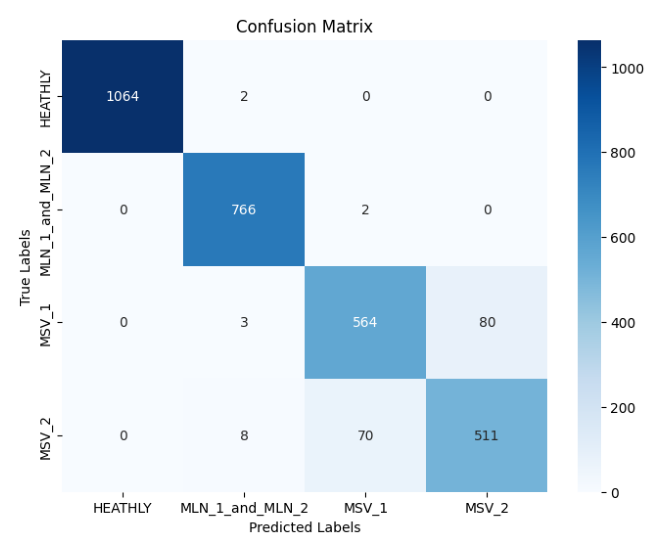

In [ ]:
# Confusion matrix
conf_matrix = confusion_matrix(all_labels, all_preds)
# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=dataset.classes, yticklabels=dataset.classes)
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()

# XAI

# XAI Impilimentation

# Saliency Maps

# Healthy


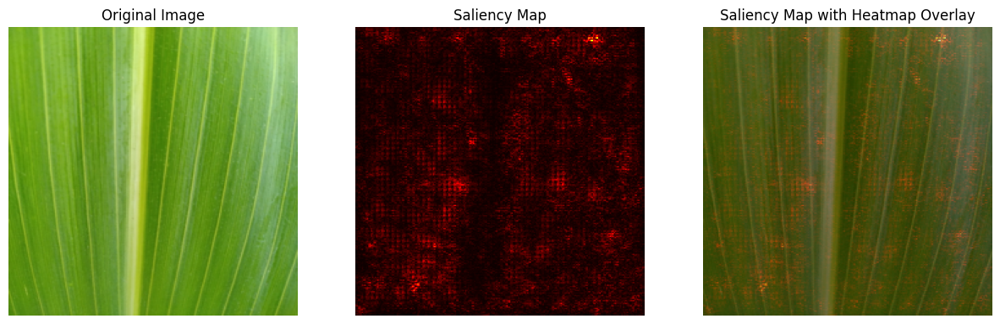

In [ ]:
import torch
import matplotlib.pyplot as plt
import numpy as np
from torchvision import transforms
from PIL import Image

# Function to preprocess the image
def preprocess_image(image_path, transform):
    image = Image.open(image_path).convert("RGB")
    image_tensor = transform(image)
    return image_tensor

# Function to generate saliency map and return necessary components
def generate_saliency_map(ensemble_model, image_tensor, label_idx):
    ensemble_model.eval()
    image_tensor.requires_grad_()
    output = ensemble_model(image_tensor.unsqueeze(0))
    loss = output[0, label_idx]
    ensemble_model.zero_grad()
    loss.backward()
    saliency = image_tensor.grad.data.abs().max(dim=0)[0]

    return saliency
def show_all_images(original_image, saliency, saliency_with_overlay):
    fig, ax = plt.subplots(1, 3, figsize=(15, 5))  # Create a 1x3 subplot

    # Original Image
    ax[0].imshow(original_image)
    ax[0].axis('off')
    ax[0].set_title('Original Image')

    # Saliency Map
    ax[1].imshow(saliency, cmap='hot')
    ax[1].axis('off')
    ax[1].set_title('Saliency Map')

    # Saliency Map with Heatmap Overlay
    ax[2].imshow(saliency_with_overlay)
    ax[2].axis('off')
    ax[2].set_title('Saliency Map with Heatmap Overlay')

    plt.show()

# Function to show saliency map with heatmap overlay and circles
def show_saliency_map_with_circles(image, saliency, title='Saliency Map with Heatmap Overlay'):
    image = image.detach().permute(1, 2, 0).cpu().numpy()
    image = (image - np.min(image)) / (np.max(image) - np.min(image))
    saliency = saliency.squeeze().cpu().numpy()
    saliency = np.maximum(saliency, 0)
    saliency = saliency / saliency.max()

    heatmap = plt.cm.hot(saliency)[:, :, :3]  # Convert to RGB
    overlay = (0.5 * image + 0.5 * heatmap)  # Blend original image with heatmap

    k = 15
    threshold = np.sort(saliency.flatten())[-k]
    coords = np.column_stack(np.where(saliency >= threshold))

    # Create a new figure for overlay
    plt.figure()
    plt.imshow(overlay)

    # Overlay circles in red
    for y, x in coords:
        circle = plt.Circle((x, y), radius=10, color='red', fill=False, linewidth=2)  # Change color to red
        plt.gca().add_artist(circle)

    plt.axis('off')
    plt.title(title)
    plt.show()

    return overlay

# Path to the image
image_path = '/kaggle/input/maizdataset/maizdataset/HEATHLY/Image_1.jpg'
transform = transforms.Compose([
    transforms.Resize((224, 224)),  # Resize as per model input
    transforms.ToTensor(),
])
image_tensor = preprocess_image(image_path, transform)
image_tensor = image_tensor.to(device)

#
label_idx = 0  # Example: Class index (change as needed)
saliency = generate_saliency_map(ensemble_model, image_tensor, label_idx)
original_image = image_tensor.detach().cpu().permute(1, 2, 0).numpy()  # Use detach() here
show_all_images(original_image, saliency.detach().cpu().numpy(), saliency_with_overlay)

# MLN

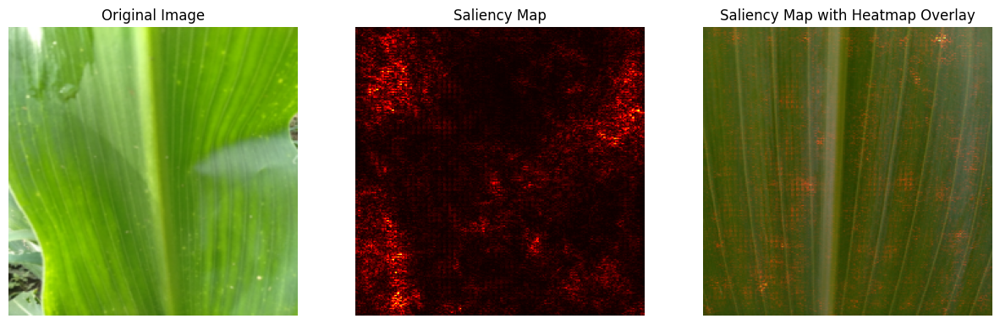

In [ ]:
import torch
import matplotlib.pyplot as plt
import numpy as np
from torchvision import transforms
from PIL import Image

# Function to preprocess the image
def preprocess_image(image_path, transform):
    image = Image.open(image_path).convert("RGB")
    image_tensor = transform(image)
    return image_tensor

# Function to generate saliency map and return necessary components
def generate_saliency_map(ensemble_model, image_tensor, label_idx):
    ensemble_model.eval()
    image_tensor.requires_grad_()
    output = ensemble_model(image_tensor.unsqueeze(0))
    loss = output[0, label_idx]
    ensemble_model.zero_grad()
    loss.backward()
    saliency = image_tensor.grad.data.abs().max(dim=0)[0]

    return saliency

# Function to show all images in one row
def show_all_images(original_image, saliency, saliency_with_overlay):
    fig, ax = plt.subplots(1, 3, figsize=(15, 5))  # Create a 1x3 subplot

    # Original Image
    ax[0].imshow(original_image)
    ax[0].axis('off')
    ax[0].set_title('Original Image')

    # Saliency Map
    ax[1].imshow(saliency, cmap='hot')
    ax[1].axis('off')
    ax[1].set_title('Saliency Map')

    # Saliency Map with Heatmap Overlay
    ax[2].imshow(saliency_with_overlay)
    ax[2].axis('off')
    ax[2].set_title('Saliency Map with Heatmap Overlay')

    plt.show()

# Function to show saliency map with heatmap overlay and circles
def show_saliency_map_with_circles(image, saliency, title='Saliency Map with Heatmap Overlay'):
    image = image.detach().permute(1, 2, 0).cpu().numpy()
    image = (image - np.min(image)) / (np.max(image) - np.min(image))
    saliency = saliency.squeeze().cpu().numpy()
    saliency = np.maximum(saliency, 0)
    saliency = saliency / saliency.max()

    # Create a heatmap overlay
    heatmap = plt.cm.hot(saliency)[:, :, :3]  # Convert to RGB
    overlay = (0.5 * image + 0.5 * heatmap)  # Blend original image with heatmap

    # Find coordinates for top k saliency points
    k = 15
    threshold = np.sort(saliency.flatten())[-k]
    coords = np.column_stack(np.where(saliency >= threshold))

    # Create a new figure for overlay
    plt.figure()
    plt.imshow(overlay)

    # Overlay circles in red
    for y, x in coords:
        circle = plt.Circle((x, y), radius=10, color='red', fill=False, linewidth=2)  # Change color to red
        plt.gca().add_artist(circle)

    plt.axis('off')
    plt.title(title)
    plt.show()

    return overlay

# Path to the image
image_path = '/kaggle/input/maizdataset/maizdataset/MLN_1_and_MLN_2/Image_1001.jpg'
transform = transforms.Compose([
    transforms.Resize((224, 224)),  # Resize as per model input
    transforms.ToTensor(),
])
image_tensor = preprocess_image(image_path, transform)
image_tensor = image_tensor.to(device)

#
label_idx = 0  # Example: Class index (change as needed)
saliency = generate_saliency_map(ensemble_model, image_tensor, label_idx)
original_image = image_tensor.detach().cpu().permute(1, 2, 0).numpy()  # Use detach() here
show_all_images(original_image, saliency.detach().cpu().numpy(), saliency_with_overlay)

# MSV1

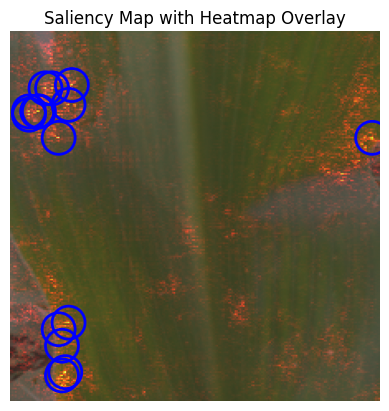

In [ ]:
def show_saliency_map_with_circles(image, saliency, title='Saliency Map with Heatmap Overlay'):
    image = image.detach().permute(1, 2, 0).cpu().numpy()
    image = (image - np.min(image)) / (np.max(image) - np.min(image))
    saliency = saliency.squeeze().cpu().numpy()
    saliency = np.maximum(saliency, 0)
    saliency = saliency / saliency.max()
    k = 15
    threshold = np.sort(saliency.flatten())[-k]
    coords = np.column_stack(np.where(saliency >= threshold))
    fig, ax = plt.subplots(1, 1)
    ax.imshow(image, alpha=0.7)
    ax.imshow(saliency, cmap='hot', alpha=0.6)
    for y, x in coords:
        circle = plt.Circle((x, y), radius=10, color='blue', fill=False, linewidth=2)
        ax.add_artist(circle)
    ax.axis('off')
    ax.set_title(title)
    plt.show()
def generate_saliency_map(ensemble_model, image_tensor, label_idx):
    model.eval()
    image_tensor.requires_grad_()
    output = ensemble_model(image_tensor.unsqueeze(0))
    loss = output[0, label_idx]
    model.zero_grad()
    loss.backward()
    saliency = image_tensor.grad.data.abs().max(dim=0)[0]
    show_saliency_map_with_circles(image_tensor.cpu(), saliency)
def preprocess_image(image_path, transform):
    image = Image.open(image_path).convert("RGB")
    image_tensor = transform(image)
    return image_tensor

image_path = '/kaggle/input/maizdataset/maizdataset/MLN_1_and_MLN_2/Image_1001.jpg'
image_tensor = preprocess_image(image_path, transform)
image_tensor = image_tensor.to(device)
label_idx = 1
generate_saliency_map(model, image_tensor, label_idx)

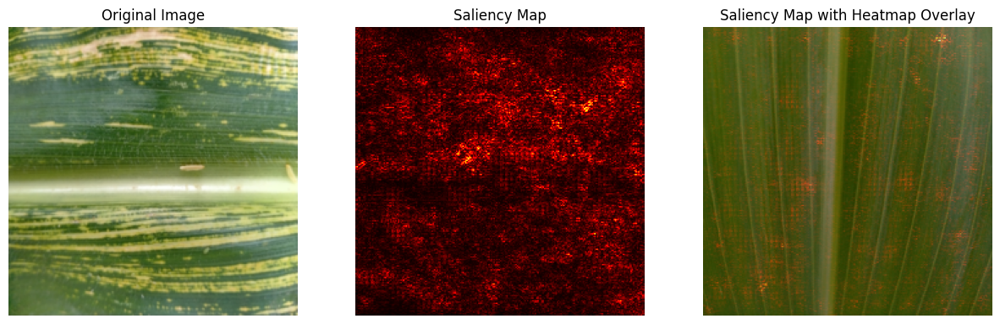

In [ ]:
import torch
import matplotlib.pyplot as plt
import numpy as np
from torchvision import transforms
from PIL import Image

# Function to preprocess the image
def preprocess_image(image_path, transform):
    image = Image.open(image_path).convert("RGB")
    image_tensor = transform(image)
    return image_tensor

# Function to generate saliency map and return necessary components
def generate_saliency_map(ensemble_model, image_tensor, label_idx):
    ensemble_model.eval()
    image_tensor.requires_grad_()
    output = ensemble_model(image_tensor.unsqueeze(0))
    loss = output[0, label_idx]
    model.zero_grad()
    loss.backward()
    saliency = image_tensor.grad.data.abs().max(dim=0)[0]

    return saliency

# Function to show all images in one row
def show_all_images(original_image, saliency, saliency_with_overlay):
    fig, ax = plt.subplots(1, 3, figsize=(15, 5))  # Create a 1x3 subplot

    # Original Image
    ax[0].imshow(original_image)
    ax[0].axis('off')
    ax[0].set_title('Original Image')

    # Saliency Map
    ax[1].imshow(saliency, cmap='hot')
    ax[1].axis('off')
    ax[1].set_title('Saliency Map')

    # Saliency Map with Heatmap Overlay
    ax[2].imshow(saliency_with_overlay)
    ax[2].axis('off')
    ax[2].set_title('Saliency Map with Heatmap Overlay')

    plt.show()

# Function to show saliency map with heatmap overlay and circles
def show_saliency_map_with_circles(image, saliency, title='Saliency Map with Heatmap Overlay'):
    image = image.detach().permute(1, 2, 0).cpu().numpy()
    image = (image - np.min(image)) / (np.max(image) - np.min(image))
    saliency = saliency.squeeze().cpu().numpy()
    saliency = np.maximum(saliency, 0)
    saliency = saliency / saliency.max()

    # Create a heatmap overlay
    heatmap = plt.cm.hot(saliency)[:, :, :3]  # Convert to RGB
    overlay = (0.5 * image + 0.5 * heatmap)  # Blend original image with heatmap

    # Find coordinates for top k saliency points
    k = 15
    threshold = np.sort(saliency.flatten())[-k]
    coords = np.column_stack(np.where(saliency >= threshold))

    # Create a new figure for overlay
    plt.figure()
    plt.imshow(overlay)

    # Overlay circles in red
    for y, x in coords:
        circle = plt.Circle((x, y), radius=10, color='red', fill=False, linewidth=2)  # Change color to red
        plt.gca().add_artist(circle)

    plt.axis('off')
    plt.title(title)
    plt.show()

    return overlay

# Path to the image
image_path = '/kaggle/input/maizdataset/maizdataset/MSV_1/Image_1004.jpg'
transform = transforms.Compose([
    transforms.Resize((224, 224)),  # Resize as per model input
    transforms.ToTensor(),
])
image_tensor = preprocess_image(image_path, transform)
image_tensor = image_tensor.to(device)

#
label_idx = 0  # Example: Class index (change as needed)
saliency = generate_saliency_map(ensemble_model, image_tensor, label_idx)
original_image = image_tensor.detach().cpu().permute(1, 2, 0).numpy()  # Use detach() here
show_all_images(original_image, saliency.detach().cpu().numpy(), saliency_with_overlay)

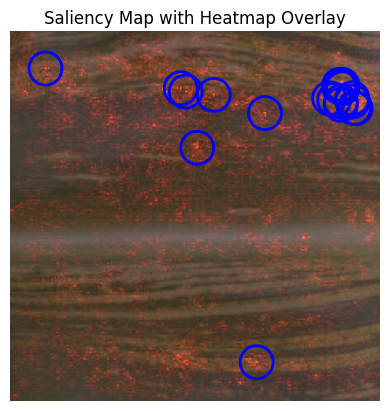

In [ ]:
def show_saliency_map_with_circles(image, saliency, title='Saliency Map with Heatmap Overlay'):
    image = image.detach().permute(1, 2, 0).cpu().numpy()
    image = (image - np.min(image)) / (np.max(image) - np.min(image))
    saliency = saliency.squeeze().cpu().numpy()
    saliency = np.maximum(saliency, 0)
    saliency = saliency / saliency.max()
    k = 20
    threshold = np.sort(saliency.flatten())[-k]
    coords = np.column_stack(np.where(saliency >= threshold))
    fig, ax = plt.subplots(1, 1)
    ax.imshow(image, alpha=0.7)
    ax.imshow(saliency, cmap='hot', alpha=0.6)
    for y, x in coords:
        circle = plt.Circle((x, y), radius=10, color='blue', fill=False, linewidth=2)
        ax.add_artist(circle)
    ax.axis('off')
    ax.set_title(title)
    plt.show()
def generate_saliency_map(ensemble_model, image_tensor, label_idx):
    ensemble_model.eval()
    image_tensor.requires_grad_()
    output = ensemble_model(image_tensor.unsqueeze(0))
    loss = output[0, label_idx]
    model.zero_grad()
    loss.backward()
    saliency = image_tensor.grad.data.abs().max(dim=0)[0]
    show_saliency_map_with_circles(image_tensor.cpu(), saliency)
def preprocess_image(image_path, transform):
    image = Image.open(image_path).convert("RGB")
    image_tensor = transform(image)
    return image_tensor

image_path = '/kaggle/input/maizdataset/maizdataset/MSV_1/Image_1004.jpg'
image_tensor = preprocess_image(image_path, transform)
image_tensor = image_tensor.to(device)
label_idx = 2
generate_saliency_map(ensemble_model, image_tensor, label_idx)

# MSV2

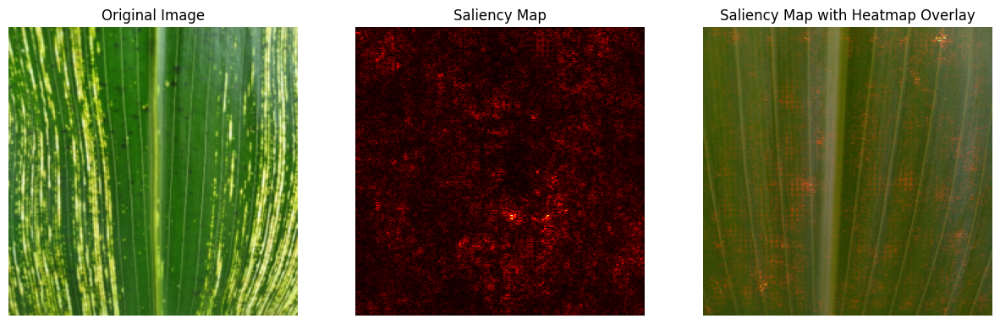

In [ ]:
import torch
import matplotlib.pyplot as plt
import numpy as np
from torchvision import transforms
from PIL import Image

# Function to preprocess the image
def preprocess_image(image_path, transform):
    image = Image.open(image_path).convert("RGB")
    image_tensor = transform(image)
    return image_tensor

# Function to generate saliency map and return necessary components
def generate_saliency_map(ensemble_model, image_tensor, label_idx):
    ensemble_model.eval()
    image_tensor.requires_grad_()
    output = model(image_tensor.unsqueeze(0))
    loss = output[0, label_idx]
    model.zero_grad()
    loss.backward()
    saliency = image_tensor.grad.data.abs().max(dim=0)[0]

    return saliency

# Function to show all images in one row
def show_all_images(original_image, saliency, saliency_with_overlay):
    fig, ax = plt.subplots(1, 3, figsize=(15, 5))  # Create a 1x3 subplot

    # Original Image
    ax[0].imshow(original_image)
    ax[0].axis('off')
    ax[0].set_title('Original Image')

    # Saliency Map
    ax[1].imshow(saliency, cmap='hot')
    ax[1].axis('off')
    ax[1].set_title('Saliency Map')

    # Saliency Map with Heatmap Overlay
    ax[2].imshow(saliency_with_overlay)
    ax[2].axis('off')
    ax[2].set_title('Saliency Map with Heatmap Overlay')

    plt.show()

# Function to show saliency map with heatmap overlay and circles
def show_saliency_map_with_circles(image, saliency, title='Saliency Map with Heatmap Overlay'):
    image = image.detach().permute(1, 2, 0).cpu().numpy()
    image = (image - np.min(image)) / (np.max(image) - np.min(image))
    saliency = saliency.squeeze().cpu().numpy()
    saliency = np.maximum(saliency, 0)
    saliency = saliency / saliency.max()

    # Create a heatmap overlay
    heatmap = plt.cm.hot(saliency)[:, :, :3]  # Convert to RGB
    overlay = (0.5 * image + 0.5 * heatmap)  # Blend original image with heatmap

    # Find coordinates for top k saliency points
    k = 15
    threshold = np.sort(saliency.flatten())[-k]
    coords = np.column_stack(np.where(saliency >= threshold))

    # Create a new figure for overlay
    plt.figure()
    plt.imshow(overlay)

    # Overlay circles in red
    for y, x in coords:
        circle = plt.Circle((x, y), radius=10, color='red', fill=False, linewidth=2)  # Change color to red
        plt.gca().add_artist(circle)

    plt.axis('off')
    plt.title(title)
    plt.show()

    return overlay

# Path to the image
image_path = '/kaggle/input/maizdataset/maizdataset/MSV_2/Image_3186.jpg'
transform = transforms.Compose([
    transforms.Resize((224, 224)),  # Resize as per model input
    transforms.ToTensor(),
])
image_tensor = preprocess_image(image_path, transform)
image_tensor = image_tensor.to(device)

#
label_idx = 3  # Example: Class index (change as needed)
saliency = generate_saliency_map(ensemble_model, image_tensor, label_idx)
original_image = image_tensor.detach().cpu().permute(1, 2, 0).numpy()  # Use detach() here
show_all_images(original_image, saliency.detach().cpu().numpy(), saliency_with_overlay)

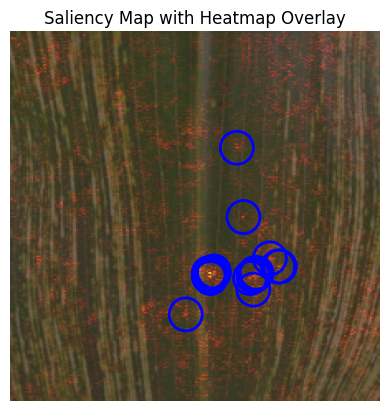

In [ ]:
def show_saliency_map_with_circles(image, saliency, title='Saliency Map with Heatmap Overlay'):
    image = image.detach().permute(1, 2, 0).cpu().numpy()
    image = (image - np.min(image)) / (np.max(image) - np.min(image))
    saliency = saliency.squeeze().cpu().numpy()
    saliency = np.maximum(saliency, 0)
    saliency = saliency / saliency.max()
    k = 20
    threshold = np.sort(saliency.flatten())[-k]
    coords = np.column_stack(np.where(saliency >= threshold))
    fig, ax = plt.subplots(1, 1)
    ax.imshow(image, alpha=0.7)
    ax.imshow(saliency, cmap='hot', alpha=0.6)
    for y, x in coords:
        circle = plt.Circle((x, y), radius=10, color='blue', fill=False, linewidth=2)
        ax.add_artist(circle)
    ax.axis('off')
    ax.set_title(title)
    plt.show()
def generate_saliency_map(ensemble_model, image_tensor, label_idx):
    ensemble_model.eval()
    image_tensor.requires_grad_()
    output = ensemble_model(image_tensor.unsqueeze(0))
    loss = output[0, label_idx]
    ensemble_model.zero_grad()
    loss.backward()
    saliency = image_tensor.grad.data.abs().max(dim=0)[0]
    show_saliency_map_with_circles(image_tensor.cpu(), saliency)
def preprocess_image(image_path, transform):
    image = Image.open(image_path).convert("RGB")
    image_tensor = transform(image)
    return image_tensor

image_path = '/kaggle/input/maizdataset/maizdataset/MSV_2/Image_3186.jpg'
image_tensor = preprocess_image(image_path, transform)
image_tensor = image_tensor.to(device)
label_idx = 3
generate_saliency_map(ensemble_model, image_tensor, label_idx)

# LIME

In [ ]:
pip install lime

Note: you may need to restart the kernel to use updated packages.


# Grad-CAM

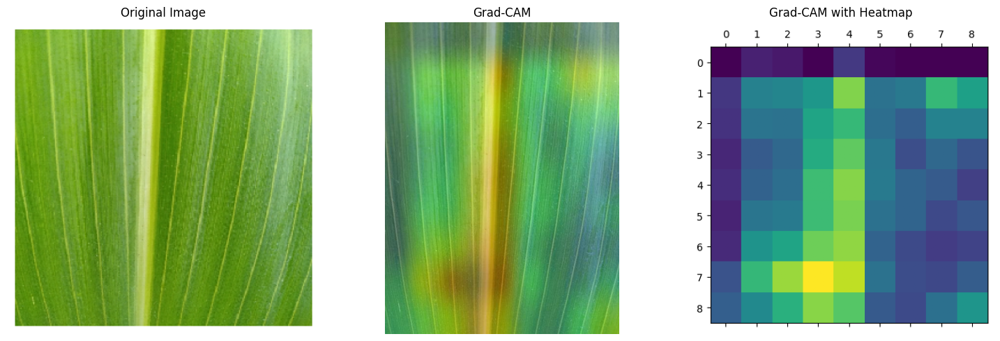

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Load the images
img1 = mpimg.imread('/kaggle/input/ahsdalsd/img/h1.png')
img3 = mpimg.imread('/kaggle/input/ahsdalsd/img/h2.png')
img2 = mpimg.imread('/kaggle/input/ahsdalsd/img/h3.jpeg')

# Create a figure and a set of subplots
fig, axs = plt.subplots(1, 3, figsize=(15, 5))  # 1 row, 3 columns

# Display each image in a subplot
axs[0].imshow(img1)
axs[0].axis('off')  # Hide the axis
axs[0].set_title('Original Image')  # Optional title

axs[1].imshow(img2)
axs[1].axis('off')  # Hide the axis
axs[1].set_title('Grad-CAM')  # Optional title

axs[2].imshow(img3)
axs[2].axis('off')  # Hide the axis
axs[2].set_title('Grad-CAM with Heatmap')  # Optional title

# Adjust layout
plt.tight_layout()
plt.show()


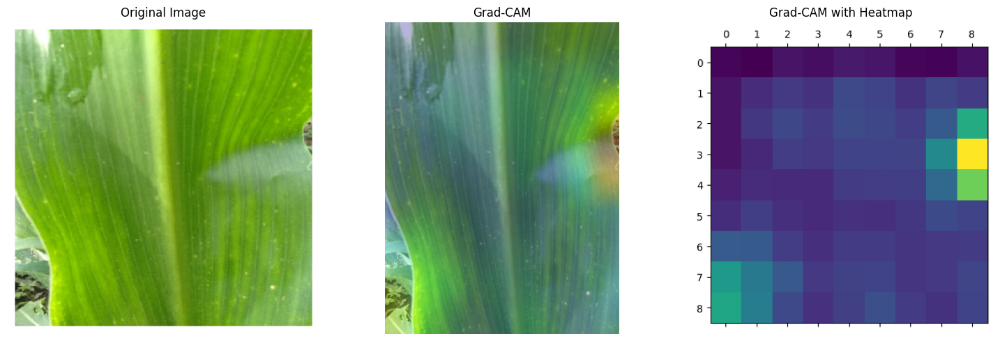

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Load the images
img1 = mpimg.imread('/kaggle/input/ahsdalsd/img/mln1.png')
img3 = mpimg.imread('/kaggle/input/ahsdalsd/img/mln2.png')
img2 = mpimg.imread('/kaggle/input/ahsdalsd/img/mln3.jpeg')

# Create a figure and a set of subplots
fig, axs = plt.subplots(1, 3, figsize=(15, 5))  # 1 row, 3 columns

# Display each image in a subplot
axs[0].imshow(img1)
axs[0].axis('off')  # Hide the axis
axs[0].set_title('Original Image')  # Optional title

axs[1].imshow(img2)
axs[1].axis('off')  # Hide the axis
axs[1].set_title('Grad-CAM')  # Optional title

axs[2].imshow(img3)
axs[2].axis('off')  # Hide the axis
axs[2].set_title('Grad-CAM with Heatmap')  # Optional title

# Adjust layout
plt.tight_layout()
plt.show()


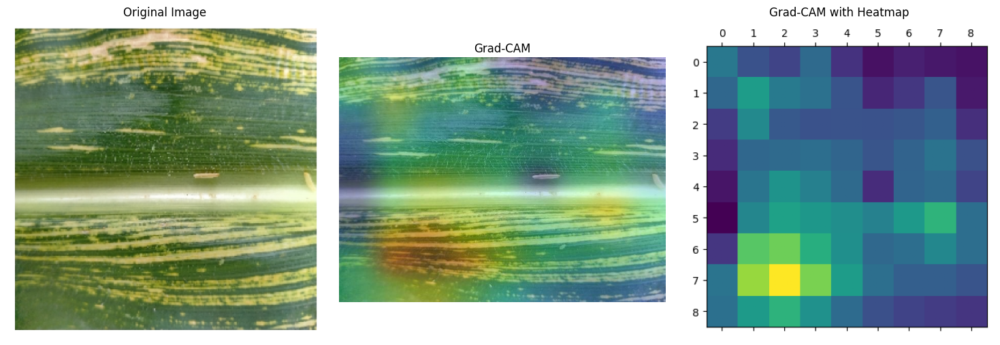

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Load the images
img1 = mpimg.imread('/kaggle/input/ahsdalsd/img/msv11.png')
img3 = mpimg.imread('/kaggle/input/ahsdalsd/img/msv12.png')
img2 = mpimg.imread('/kaggle/input/ahsdalsd/img/msv13.jpeg')

# Create a figure and a set of subplots
fig, axs = plt.subplots(1, 3, figsize=(15, 5))  # 1 row, 3 columns

# Display each image in a subplot
axs[0].imshow(img1)
axs[0].axis('off')  # Hide the axis
axs[0].set_title('Original Image')  # Optional title

axs[1].imshow(img2)
axs[1].axis('off')  # Hide the axis
axs[1].set_title('Grad-CAM')  # Optional title

axs[2].imshow(img3)
axs[2].axis('off')  # Hide the axis
axs[2].set_title('Grad-CAM with Heatmap')  # Optional title

# Adjust layout
plt.tight_layout()
plt.show()

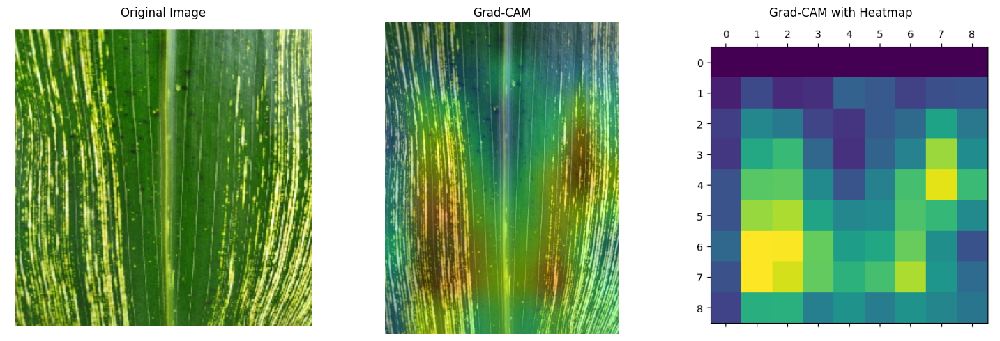

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Load the images
img1 = mpimg.imread('/kaggle/input/ahsdalsd/img/msv21.png')
img3 = mpimg.imread('/kaggle/input/ahsdalsd/img/msv22.png')
img2 = mpimg.imread('/kaggle/input/ahsdalsd/img/msv23.jpeg')

# Create a figure and a set of subplots
fig, axs = plt.subplots(1, 3, figsize=(15, 5))  # 1 row, 3 columns

# Display each image in a subplot
axs[0].imshow(img1)
axs[0].axis('off')  # Hide the axis
axs[0].set_title('Original Image')  # Optional title

axs[1].imshow(img2)
axs[1].axis('off')  # Hide the axis
axs[1].set_title('Grad-CAM')  # Optional title

axs[2].imshow(img3)
axs[2].axis('off')  # Hide the axis
axs[2].set_title('Grad-CAM with Heatmap')  # Optional title

# Adjust layout
plt.tight_layout()
plt.show()

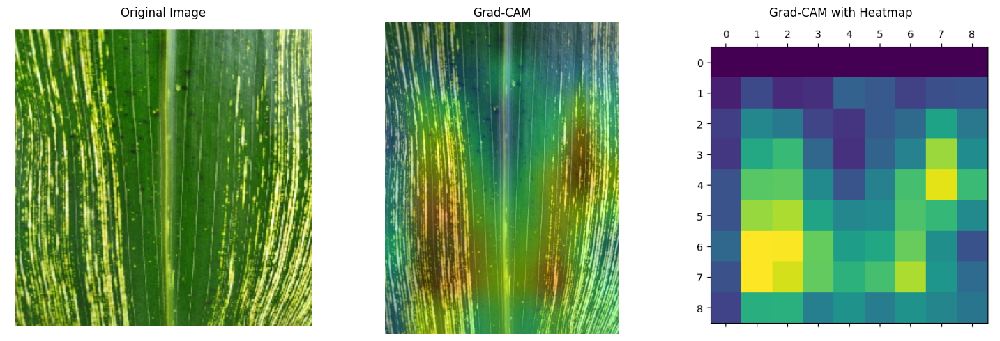

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Load the images
img1 = mpimg.imread('/kaggle/input/ahsdalsd/img/msv21.png')
img3 = mpimg.imread('/kaggle/input/ahsdalsd/img/msv22.png')
img2 = mpimg.imread('/kaggle/input/ahsdalsd/img/msv23.jpeg')

# Create a figure and a set of subplots
fig, axs = plt.subplots(1, 3, figsize=(15, 5))  # 1 row, 3 columns

# Display each image in a subplot
axs[0].imshow(img1)
axs[0].axis('off')  # Hide the axis
axs[0].set_title('Original Image')  # Optional title

axs[1].imshow(img2)
axs[1].axis('off')  # Hide the axis
axs[1].set_title('Grad-CAM')  # Optional title

axs[2].imshow(img3)
axs[2].axis('off')  # Hide the axis
axs[2].set_title('Grad-CAM with Heatmap')  # Optional title

# Adjust layout
plt.tight_layout()
plt.show()

In [ ]:
#basics
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# Tools for accessing and reading data (you do not need to use all of them)
import os
import pathlib
import PIL
import cv2
import skimage
from IPython.display import Image, display
from matplotlib.image import imread
import matplotlib.cm as cm

# Tensorflow basics
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from tensorflow.keras.preprocessing import image


#Lime package for ML explainability
from lime import lime_image

# for reproducibility (does not guarantee fully reproducible results )
import random
seed = 0
random.seed(seed)
np.random.seed(seed)
tf.random.set_seed(seed)

# LIME

# Healthy

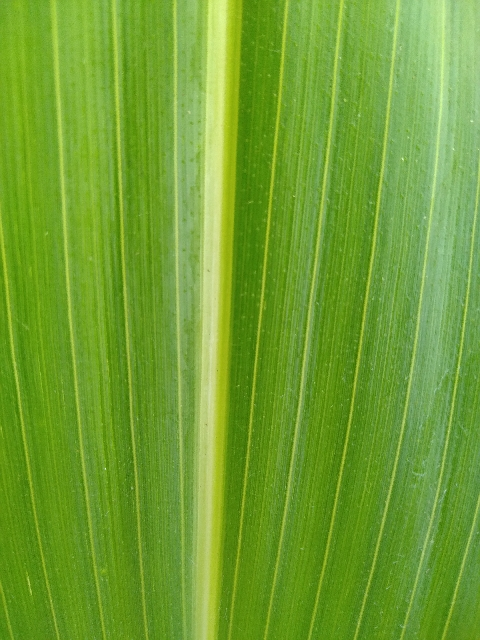

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
Predicted class: 592 with confidence: 278.44%


In [ ]:
# The path to our target image
img_path = '/kaggle/input/maizdataset/maizdataset/HEATHLY/Image_1.jpg'
display(Image(img_path))
def get_img_array(img_path, img_size=(224, 224)):
    # Load the image
    img = keras.preprocessing.image.load_img(img_path, target_size=img_size)
    # Convert image to array
    img_array = keras.preprocessing.image.img_to_array(img)
    # Expand dimensions to match the input shape expected by the model
    img_array = np.expand_dims(img_array, axis=0)
    return img_array
img_size = (224, 224)  # Set the size to 224x224 as expected by EfficientNetB2
images = get_img_array(img_path, img_size)
preds = ensemble_model.predict(images)
prediction = np.argmax(preds)
pct = np.max(preds)
print(f"Predicted class: {prediction} with confidence: {pct * 100:.2f}%")

In [ ]:
# images = get_img_array(img_path, img_size)
# preds = pretrained_model.predict(images)
# prediction = np.argmax(preds)
# pct = np.max(preds)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


  0%|          | 0/300 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━

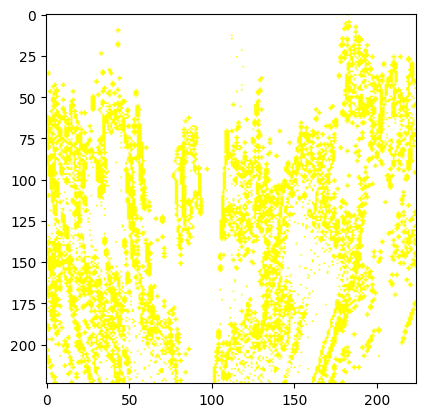

In [ ]:
explainer = lime_image.LimeImageExplainer()
explanation = explainer.explain_instance(images[0].astype('double'), ensemble_model.predict,
                                        top_labels=4, hide_color=0, num_samples=300)
from skimage.segmentation import mark_boundaries
temp_1, mask_1 = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=True, num_features=20, hide_rest=False)
plt.imshow(mark_boundaries(temp_1, mask_1))

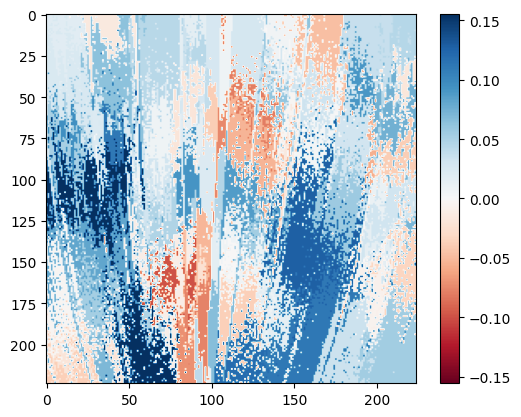

In [ ]:
ind =  explanation.top_labels[0]
dict_heatmap = dict(explanation.local_exp[ind])
heatmap = np.vectorize(dict_heatmap.get)(explanation.segments)
plt.imshow(heatmap, cmap = 'RdBu', vmin  = -heatmap.max(), vmax = heatmap.max())
plt.colorbar()

# MLN

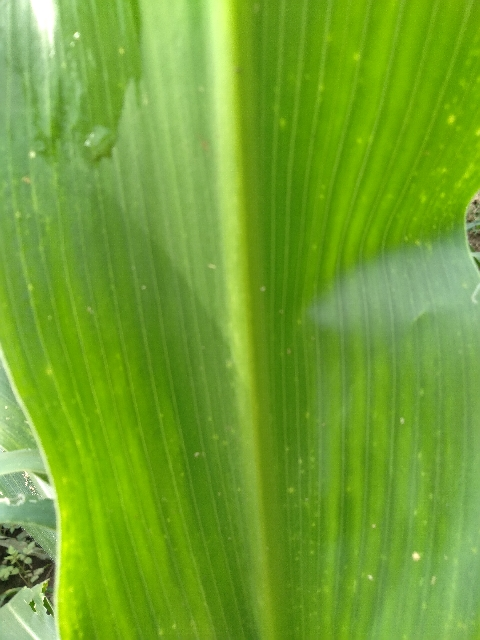

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
Predicted class: 432 with confidence: 235.51%


In [ ]:
# The path to our target image
img_path = '/kaggle/input/maizdataset/maizdataset/MLN_1_and_MLN_2/Image_1001.jpg'
display(Image(img_path))
def get_img_array(img_path, img_size=(224, 224)):
    # Load the image
    img = keras.preprocessing.image.load_img(img_path, target_size=img_size)
    # Convert image to array
    img_array = keras.preprocessing.image.img_to_array(img)
    # Expand dimensions to match the input shape expected by the model
    img_array = np.expand_dims(img_array, axis=0)
    return img_array
img_size = (224, 224)  # Set the size to 224x224 as expected by EfficientNetB2
images = get_img_array(img_path, img_size)
preds = ensemble_model.predict(images)
prediction = np.argmax(preds)
pct = np.max(preds)
print(f"Predicted class: {prediction} with confidence: {pct * 100:.2f}%")

  0%|          | 0/300 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━

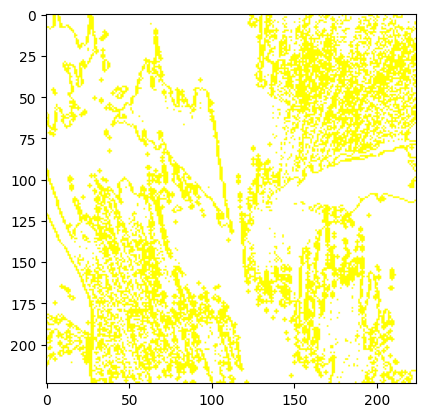

In [ ]:
explainer = lime_image.LimeImageExplainer()
explanation = explainer.explain_instance(images[0].astype('double'), ensemble_model.predict,
                                        top_labels=4, hide_color=0, num_samples=300)
from skimage.segmentation import mark_boundaries
temp_1, mask_1 = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=True, num_features=20, hide_rest=False)
plt.imshow(mark_boundaries(temp_1, mask_1))

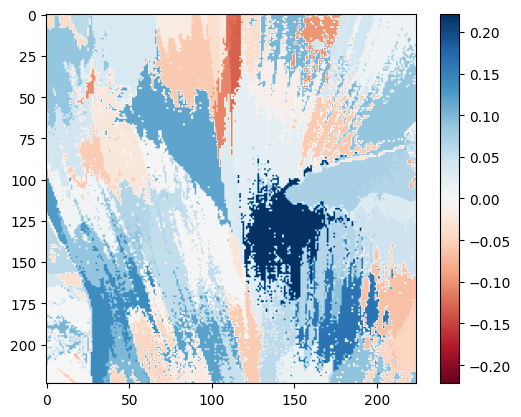

In [ ]:
ind =  explanation.top_labels[0]
dict_heatmap = dict(explanation.local_exp[ind])
heatmap = np.vectorize(dict_heatmap.get)(explanation.segments)
plt.imshow(heatmap, cmap = 'RdBu', vmin  = -heatmap.max(), vmax = heatmap.max())
plt.colorbar()

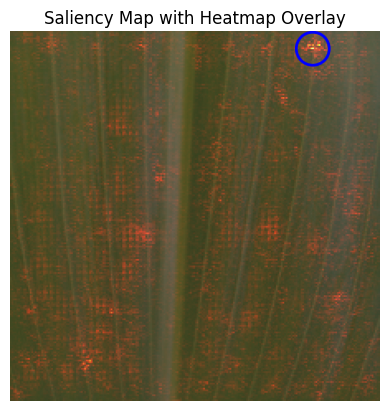

In [ ]:
def show_saliency_map_with_circles(image, saliency, title='Saliency Map with Heatmap Overlay'):
    image = image.detach().permute(1, 2, 0).cpu().numpy()
    image = (image - np.min(image)) / (np.max(image) - np.min(image))
    saliency = saliency.squeeze().cpu().numpy()
    saliency = np.maximum(saliency, 0)
    saliency = saliency / saliency.max()
    k = 1
    threshold = np.sort(saliency.flatten())[-k]
    coords = np.column_stack(np.where(saliency >= threshold))
    fig, ax = plt.subplots(1, 1)
    ax.imshow(image, alpha=0.7)
    ax.imshow(saliency, cmap='hot', alpha=0.6)
    for y, x in coords:
        circle = plt.Circle((x, y), radius=10, color='blue', fill=False, linewidth=2)
        ax.add_artist(circle)
    ax.axis('off')
    ax.set_title(title)
    plt.show()
def generate_saliency_map(ensemble_model, image_tensor, label_idx):
    ensemble_model.eval()
    image_tensor.requires_grad_()
    output = ensemble_model(image_tensor.unsqueeze(0))
    loss = output[0, label_idx]
    ensemble_model.zero_grad()
    loss.backward()
    saliency = image_tensor.grad.data.abs().max(dim=0)[0]
    show_saliency_map_with_circles(image_tensor.cpu(), saliency)
def preprocess_image(image_path, transform):
    image = Image.open(image_path).convert("RGB")
    image_tensor = transform(image)
    return image_tensor

image_path = '/kaggle/input/maizdataset/maizdataset/HEATHLY/Image_1.jpg'
image_tensor = preprocess_image(image_path, transform)
image_tensor = image_tensor.to(device)
label_idx = 0
generate_saliency_map(ensemble_model, image_tensor, label_idx)

# MSV_1

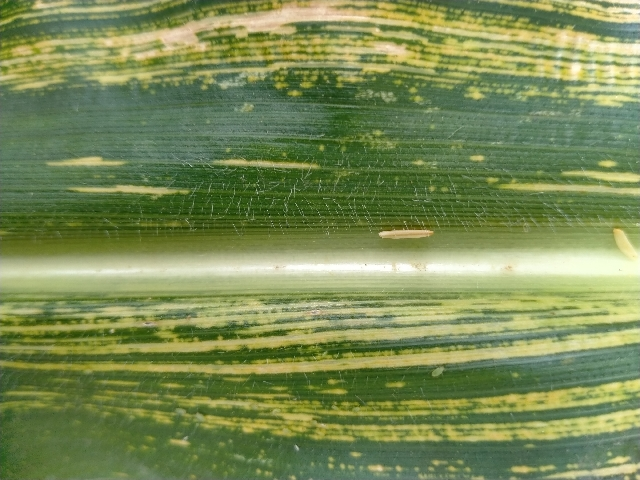

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
Predicted class: 1228 with confidence: 222.28%


In [ ]:
# The path to our target image
img_path = '/kaggle/input/maizdataset/maizdataset/MSV_1/Image_1004.jpg'
# The path to our target image
display(Image(img_path))
def get_img_array(img_path, img_size=(224, 224)):
    # Load the image
    img = keras.preprocessing.image.load_img(img_path, target_size=img_size)
    # Convert image to array
    img_array = keras.preprocessing.image.img_to_array(img)
    # Expand dimensions to match the input shape expected by the model
    img_array = np.expand_dims(img_array, axis=0)
    return img_array
img_size = (224, 224)  # Set the size to 224x224 as expected by EfficientNetB2
images = get_img_array(img_path, img_size)
preds = ensemble_model.predict(images)
prediction = np.argmax(preds)
pct = np.max(preds)
print(f"Predicted class: {prediction} with confidence: {pct * 100:.2f}%")

  0%|          | 0/300 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━

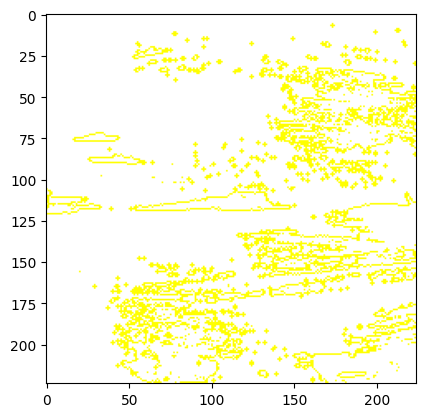

In [ ]:
explainer = lime_image.LimeImageExplainer()
explanation = explainer.explain_instance(images[0].astype('double'), ensemble_model.predict,
                                        top_labels=4, hide_color=0, num_samples=300)
from skimage.segmentation import mark_boundaries
temp_1, mask_1 = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=True, num_features=20, hide_rest=False)
plt.imshow(mark_boundaries(temp_1, mask_1))

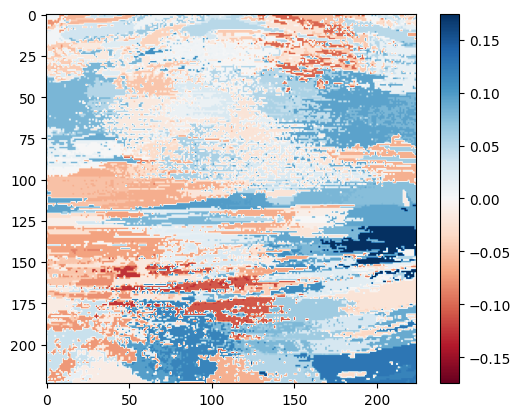

In [ ]:
ind =  explanation.top_labels[0]
dict_heatmap = dict(explanation.local_exp[ind])
heatmap = np.vectorize(dict_heatmap.get)(explanation.segments)
plt.imshow(heatmap, cmap = 'RdBu', vmin  = -heatmap.max(), vmax = heatmap.max())
plt.colorbar()

# MSV_2

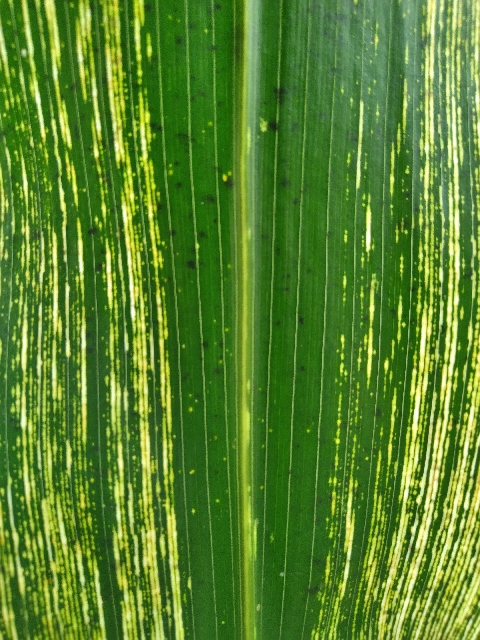

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
Predicted class: 432 with confidence: 271.63%


In [ ]:
# The path to our target image
img_path = '/kaggle/input/maizdataset/maizdataset/MSV_2/Image_3186.jpg'
display(Image(img_path))
def get_img_array(img_path, img_size=(224, 224)):
    # Load the image
    img = keras.preprocessing.image.load_img(img_path, target_size=img_size)
    # Convert image to array
    img_array = keras.preprocessing.image.img_to_array(img)
    # Expand dimensions to match the input shape expected by the model
    img_array = np.expand_dims(img_array, axis=0)
    return img_array
img_size = (224, 224)  # Set the size to 224x224 as expected by EfficientNetB2
images = get_img_array(img_path, img_size)
preds = ensemble_model.predict(images)
prediction = np.argmax(preds)
pct = np.max(preds)
print(f"Predicted class: {prediction} with confidence: {pct * 100:.2f}%")

  0%|          | 0/300 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━

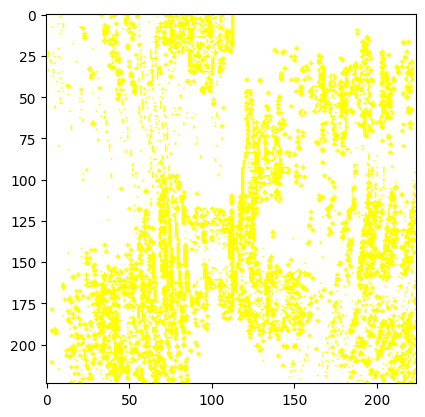

In [ ]:
explainer = lime_image.LimeImageExplainer()
explanation = explainer.explain_instance(images[0].astype('double'), ensemble_model.predict,
                                        top_labels=4, hide_color=0, num_samples=300)
from skimage.segmentation import mark_boundaries
temp_1, mask_1 = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=True, num_features=20, hide_rest=False)
plt.imshow(mark_boundaries(temp_1, mask_1))

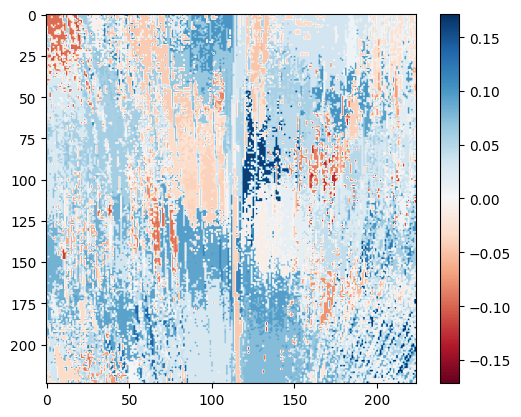

In [ ]:
ind =  explanation.top_labels[0]
dict_heatmap = dict(explanation.local_exp[ind])
heatmap = np.vectorize(dict_heatmap.get)(explanation.segments)
plt.imshow(heatmap, cmap = 'RdBu', vmin  = -heatmap.max(), vmax = heatmap.max())
plt.colorbar()

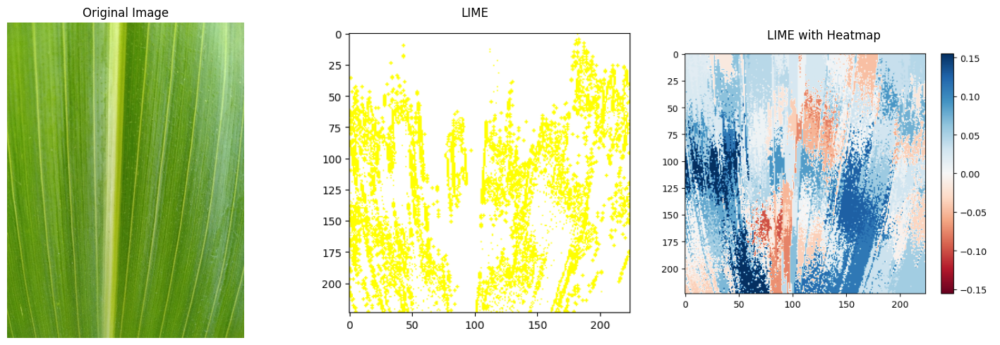

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Load the images
img1 = mpimg.imread('/kaggle/input/limelime/lime/limeh1.jpeg')
img2 = mpimg.imread('/kaggle/input/limelime/lime/limeh2.png')
img3 = mpimg.imread('/kaggle/input/limelime/lime/limeh3.png')

# Create a figure and a set of subplots
fig, axs = plt.subplots(1, 3, figsize=(15, 5))  # 1 row, 3 columns

# Display each image in a subplot
axs[0].imshow(img1)
axs[0].axis('off')  # Hide the axis
axs[0].set_title('Original Image')  # Optional title

axs[1].imshow(img2)
axs[1].axis('off')  # Hide the axis
axs[1].set_title('LIME')  # Optional title

axs[2].imshow(img3)
axs[2].axis('off')  # Hide the axis
axs[2].set_title('LIME with Heatmap')  # Optional title

# Adjust layout
plt.tight_layout()
plt.show()

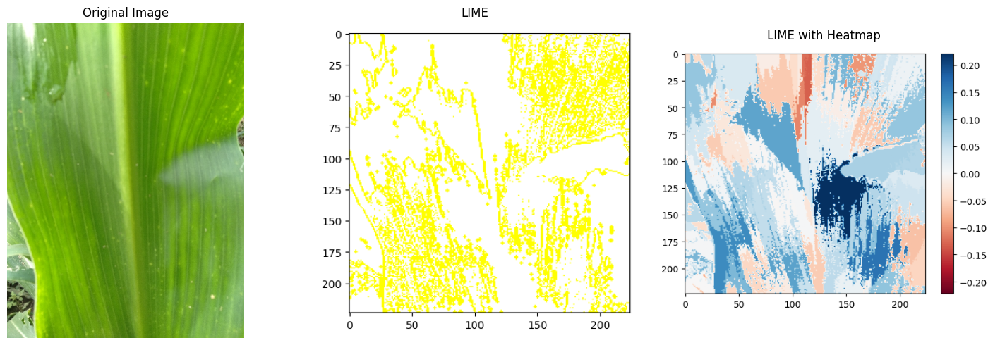

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Load the images
img1 = mpimg.imread('/kaggle/input/limelime/lime/limemln1.jpeg')
img2 = mpimg.imread('/kaggle/input/limelime/lime/limemln2.png')
img3 = mpimg.imread('/kaggle/input/limelime/lime/limemln3.png')

# Create a figure and a set of subplots
fig, axs = plt.subplots(1, 3, figsize=(15, 5))  # 1 row, 3 columns

# Display each image in a subplot
axs[0].imshow(img1)
axs[0].axis('off')  # Hide the axis
axs[0].set_title('Original Image')  # Optional title

axs[1].imshow(img2)
axs[1].axis('off')  # Hide the axis
axs[1].set_title('LIME')  # Optional title

axs[2].imshow(img3)
axs[2].axis('off')  # Hide the axis
axs[2].set_title('LIME with Heatmap')  # Optional title

# Adjust layout
plt.tight_layout()
plt.show()

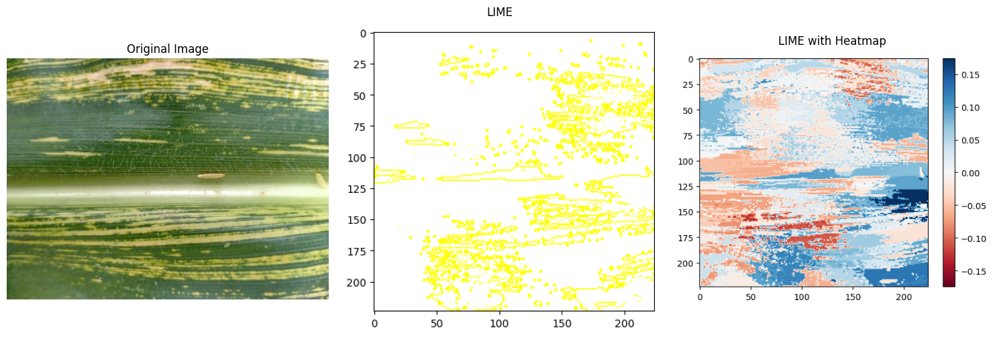

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Load the images
img1 = mpimg.imread('/kaggle/input/limelime/lime/limemsv1.jpeg')
img2 = mpimg.imread('/kaggle/input/limelime/lime/limemsv2.png')
img3 = mpimg.imread('/kaggle/input/limelime/lime/limemsv3.png')

# Create a figure and a set of subplots
fig, axs = plt.subplots(1, 3, figsize=(15, 5))  # 1 row, 3 columns

# Display each image in a subplot
axs[0].imshow(img1)
axs[0].axis('off')  # Hide the axis
axs[0].set_title('Original Image')  # Optional title

axs[1].imshow(img2)
axs[1].axis('off')  # Hide the axis
axs[1].set_title('LIME')  # Optional title

axs[2].imshow(img3)
axs[2].axis('off')  # Hide the axis
axs[2].set_title('LIME with Heatmap')  # Optional title

# Adjust layout
plt.tight_layout()
plt.show()

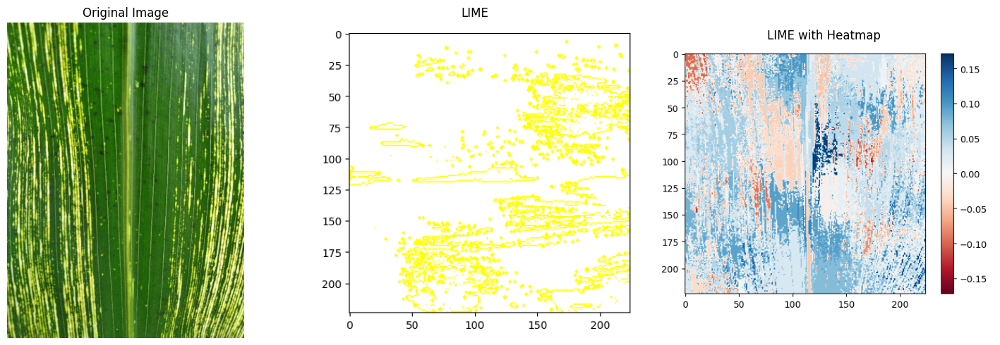

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Load the images
img1 = mpimg.imread('/kaggle/input/limelime/lime/limemsv21.jpeg')
img2 = mpimg.imread('/kaggle/input/limelime/lime/limemsv2.png')
img3 = mpimg.imread('/kaggle/input/limelime/lime/limemsv23.png')

# Create a figure and a set of subplots
fig, axs = plt.subplots(1, 3, figsize=(15, 5))  # 1 row, 3 columns

# Display each image in a subplot
axs[0].imshow(img1)
axs[0].axis('off')  # Hide the axis
axs[0].set_title('Original Image')  # Optional title

axs[1].imshow(img2)
axs[1].axis('off')  # Hide the axis
axs[1].set_title('LIME')  # Optional title

axs[2].imshow(img3)
axs[2].axis('off')  # Hide the axis
axs[2].set_title('LIME with Heatmap')  # Optional title

# Adjust layout
plt.tight_layout()
plt.show()

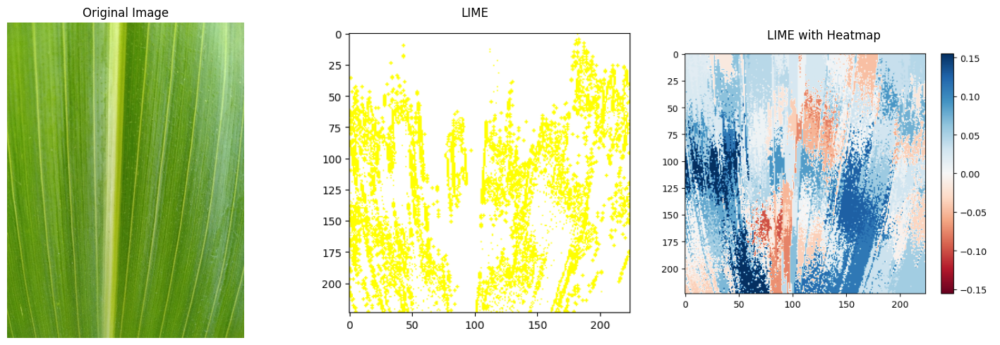

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Load the images
img1 = mpimg.imread('/kaggle/input/limelime/lime/limeh1.jpeg')
img2 = mpimg.imread('/kaggle/input/limelime/lime/limeh2.png')
img3 = mpimg.imread('/kaggle/input/limelime/lime/limeh3.png')

# Create a figure and a set of subplots
fig, axs = plt.subplots(1, 3, figsize=(15, 5))  # 1 row, 3 columns

# Display each image in a subplot
axs[0].imshow(img1)
axs[0].axis('off')  # Hide the axis
axs[0].set_title('Original Image')  # Optional title

axs[1].imshow(img2)
axs[1].axis('off')  # Hide the axis
axs[1].set_title('LIME')  # Optional title

axs[2].imshow(img3)
axs[2].axis('off')  # Hide the axis
axs[2].set_title('LIME with Heatmap')  # Optional title

# Adjust layout
plt.tight_layout()
plt.show()

# SHAP

102967424/102967424 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  50%|█████     | 1/2 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer: 3it [00:37, 18.76s/it]               


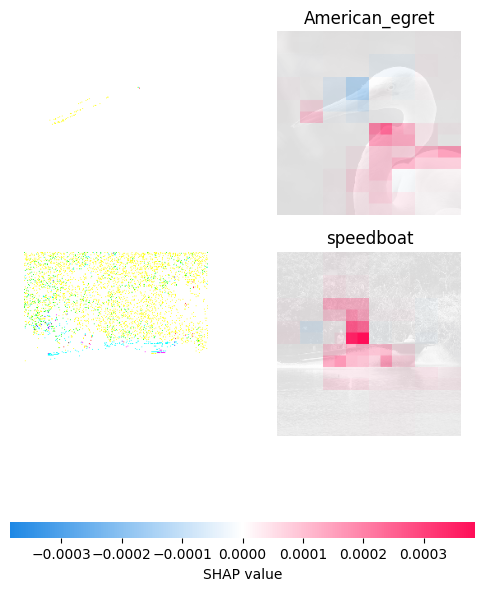

In [ ]:
import json

from tensorflow.keras.applications.resnet50 import ResNet50, preprocess_input

import shap

# load pre-trained model and choose two images to explain
model = ResNet50(weights="imagenet")


def f(X):
    tmp = X.copy()
    preprocess_input(tmp)
    return model(tmp)


X, y = shap.datasets.imagenet50()

# load the ImageNet class names as a vectorized mapping function from ids to names
url = "https://s3.amazonaws.com/deep-learning-models/image-models/imagenet_class_index.json"
with open(shap.datasets.cache(url)) as file:
    class_names = [v[1] for v in json.load(file).values()]

# define a masker that is used to mask out partitions of the input image, this one uses a blurred background
masker = shap.maskers.Image("inpaint_telea", X[0].shape)

# By default the Partition explainer is used for all  partition explainer
explainer = shap.Explainer(f, masker, output_names=class_names)

# here we use 500 evaluations of the underlying model to estimate the SHAP values
shap_values = explainer(X[1:3], max_evals=500, batch_size=50, outputs=shap.Explanation.argsort.flip[:1])
shap.image_plot(shap_values)

In [ ]:
model.summary()

Model: "resnet50"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 230, 230,  │          0 │ input_layer[0][0] │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 56, 56,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      4,160 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,928 │ conv2_block1_1_r… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 56, 56,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 56, 56,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 56, 56,    │     16,640 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 56, 56,    │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_0_c… │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_3_c

 Total params: 25,636,712 (97.80 MB)

 Trainable params: 25,583,592 (97.59 MB)

 Non-trainable params: 53,120 (207.50 KB)

In [ ]:
X

array([[[[ 33.,  23.,  24.],
         [ 72.,  64.,  61.],
         [ 68.,  61.,  53.],
         ...,
         [ 86., 113., 158.],
         [124., 148., 182.],
         [ 41.,  65., 103.]],

        [[ 63.,  51.,  51.],
         [ 23.,  13.,  11.],
         [ 38.,  29.,  22.],
         ...,
         [ 77., 106., 150.],
         [ 94., 123., 163.],
         [ 72.,  95., 137.]],

        [[ 29.,  20.,  13.],
         [ 37.,  28.,  19.],
         [ 64.,  55.,  46.],
         ...,
         [ 83., 110., 153.],
         [ 94., 127., 170.],
         [131., 153., 194.]],

        ...,

        [[ 98., 153., 122.],
         [ 72., 140., 103.],
         [ 49.,  79.,  53.],
         ...,
         [207., 171.,  75.],
         [ 78.,  61.,  15.],
         [ 56.,  96.,  72.]],

        [[ 92., 142., 113.],
         [ 72., 143., 103.],
         [ 53.,  79.,  52.],
         ...,
         [249., 209., 114.],
         [116.,  91.,  35.],
         [ 62.,  96.,  71.]],

        [[ 96., 151., 122.],
       

In [ ]:
import tensorflow as tflow
from tensorflow.keras.layers import Dense, Flatten
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam


In [ ]:
import pathlib

directory = "/kaggle/input/maizdataset/maizdataset"

data_directory = pathlib.Path(directory)

In [ ]:
for subdirectory in data_directory.iterdir():
    if subdirectory.is_dir():
        folder_name = subdirectory.name
        image_count = len(list(subdirectory.glob("*.jpg"))) + len(list(subdirectory.glob("*.png")))
        print(f"Folder '{folder_name}' contains {image_count} images.")

Folder 'MLN_1_and_MLN_2' contains 3980 images.
Folder 'HEATHLY' contains 5117 images.
Folder 'MSV_2' contains 3095 images.
Folder 'MSV_1' contains 3157 images.


In [ ]:
img_height,img_width=224,224

batch_size=32

train_ds = tflow.keras.preprocessing.image_dataset_from_directory(

  data_directory,

  validation_split=0.2,

  subset="training",

  seed=123,

label_mode='categorical',

  image_size=(img_height, img_width),

  batch_size=batch_size)

Found 15349 files belonging to 4 classes.
Using 12280 files for training.


In [ ]:
validation_ds = tflow.keras.preprocessing.image_dataset_from_directory(

  data_directory,

  validation_split=0.2,

  subset="validation",

  seed=123,

label_mode='categorical',

  image_size=(img_height, img_width),

  batch_size=batch_size)

Found 15349 files belonging to 4 classes.
Using 3069 files for validation.


In [ ]:
demo_resnet_model = Sequential()

pretrained_model_for_demo= tflow.keras.applications.ResNet50(include_top=False,

                   input_shape=(224,224,3),

                   pooling='avg',classes=4,

                   weights='imagenet')

for each_layer in pretrained_model_for_demo.layers:

        each_layer.trainable=False

demo_resnet_model.add(pretrained_model_for_demo)

94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step


In [ ]:
demo_resnet_model.add(Flatten())

demo_resnet_model.add(Dense(512, activation='relu'))

demo_resnet_model.add(Dense(4, activation='softmax'))

In [ ]:
demo_resnet_model.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])

history = demo_resnet_model.fit(train_ds, validation_data=validation_ds, epochs=10)

Epoch 1/10


I0000 00:00:1728634908.689011      96 service.cc:145] XLA service 0x7ae220013f20 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1728634908.689075      96 service.cc:153]   StreamExecutor device (0): Tesla P100-PCIE-16GB, Compute Capability 6.0


  4/384 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step - accuracy: 0.2272 - loss: 1.3888 

I0000 00:00:1728634913.753661      96 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


384/384 ━━━━━━━━━━━━━━━━━━━━ 58s 118ms/step - accuracy: 0.6722 - loss: 0.8026 - val_accuracy: 0.7576 - val_loss: 0.4453
Epoch 2/10
384/384 ━━━━━━━━━━━━━━━━━━━━ 35s 90ms/step - accuracy: 0.7620 - loss: 0.4607 - val_accuracy: 0.7739 - val_loss: 0.4292
Epoch 3/10
384/384 ━━━━━━━━━━━━━━━━━━━━ 35s 91ms/step - accuracy: 0.7727 - loss: 0.4522 - val_accuracy: 0.7654 - val_loss: 0.4371
Epoch 4/10
384/384 ━━━━━━━━━━━━━━━━━━━━ 35s 90ms/step - accuracy: 0.7733 - loss: 0.4279 - val_accuracy: 0.7853 - val_loss: 0.3865
Epoch 5/10
384/384 ━━━━━━━━━━━━━━━━━━━━ 35s 92ms/step - accuracy: 0.7611 - loss: 0.4546 - val_accuracy: 0.7709 - val_loss: 0.4395
Epoch 6/10
384/384 ━━━━━━━━━━━━━━━━━━━━ 35s 92ms/step - accuracy: 0.7708 - loss: 0.4094 - val_accuracy: 0.7840 - val_loss: 0.3862
Epoch 7/10
384/384 ━━━━━━━━━━━━━━━━━━━━ 36s 93ms/step - accuracy: 0.7691 - loss: 0.4282 - val_accuracy: 0.7683 - val_loss: 0.4069
Epoch 8/10
384/384 ━━━━━━━━━━━━━━━━━━━━ 35s 92ms/step - accuracy: 0.7700 - loss: 0.4031 - val_accura

In [ ]:
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
import torch

# Step 1: Set the data directory and transformations
data_dir = '/kaggle/input/maizdataset/maizdataset'

transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Step 2: Load the dataset
dataset = datasets.ImageFolder(root=data_dir, transform=transform)
print("Classes:", dataset.classes)

# Step 3: Create DataLoader to load data in batches
dataloader = DataLoader(dataset, batch_size=1, shuffle=False)

# Step 4: Prepare X (features) and y (labels)
X = []
y = []

# Loop through the dataloader to extract images and labels
for inputs, labels in dataloader:
    X.append(inputs)  # Store the image tensor (features)
    y.append(labels)  # Store the label (class index)

# Convert lists to tensors
X = torch.cat(X)  # X will be a tensor containing all the image tensors
y = torch.cat(y)  # y will be a tensor containing the corresponding labels

print("X shape:", X.shape)  # Shape of X: [num_samples, channels, height, width]
print("y shape:", y.shape)  # Shape of y: [num_samples]


Classes: ['HEATHLY', 'MLN_1_and_MLN_2', 'MSV_1', 'MSV_2']
X shape: torch.Size([15349, 3, 224, 224])
y shape: torch.Size([15349])


In [ ]:
X

tensor([[[[-0.1999, -0.2342, -0.2171,  ...,  0.5536,  0.5536,  0.6221],
          [-0.2171, -0.2171, -0.1486,  ...,  0.6221,  0.6049,  0.6392],
          [-0.2513, -0.2684, -0.2342,  ...,  0.6049,  0.6221,  0.6392],
          ...,
          [-0.8507, -0.8507, -0.7822,  ..., -0.4568, -0.4568, -0.4397],
          [-0.7822, -0.8335, -0.7650,  ..., -0.4911, -0.3883, -0.3883],
          [-0.6623, -0.8507, -0.7993,  ..., -0.5424, -0.3369, -0.3369]],

         [[ 0.8004,  0.8179,  0.8529,  ...,  1.4657,  1.4307,  1.5182],
          [ 0.8354,  0.8354,  0.9230,  ...,  1.5182,  1.4832,  1.5182],
          [ 0.8354,  0.8179,  0.8354,  ...,  1.5357,  1.5007,  1.5182],
          ...,
          [ 0.3102,  0.2927,  0.3102,  ...,  0.4678,  0.5028,  0.5378],
          [ 0.3803,  0.2927,  0.3277,  ...,  0.4678,  0.5728,  0.5378],
          [ 0.4328,  0.2927,  0.3452,  ...,  0.4328,  0.5903,  0.5203]],

         [[-1.0376, -1.0724, -1.0550,  ...,  0.2871,  0.3219,  0.4614],
          [-1.0201, -1.0724, -

In [ ]:
y

tensor([0, 0, 0,  ..., 3, 3, 3])

In [ ]:
class_names = ['HEATHLY', 'MLN_1_and_MLN_2', 'MSV_1', 'MSV_2']

In [ ]:
def f(X):
    tmp = X.copy()
    preprocess_input(tmp)
    return demo_resnet_model(tmp)

In [ ]:
# define a masker that is used to mask out partitions of the input image, this one uses a blurred background
masker = shap.maskers.Image("inpaint_telea", X[0].shape)

# By default the Partition explainer is used for all  partition explainer
explainer = shap.Explainer(f, masker, output_names=class_names)

# here we use 500 evaluations of the underlying model to estimate the SHAP values
shap_values = explainer(X[1:3], max_evals=500, batch_size=50, outputs=shap.Explanation.argsort.flip[:1])
shap.image_plot(shap_values)

ValueError: Exception encountered when calling Sequential.call().

[1mInput 0 of layer "resnet50" is incompatible with the layer: expected shape=(None, 224, 224, 3), found shape=(1, 3, 224, 224)[0m

Arguments received by Sequential.call():
  • inputs=tf.Tensor(shape=(1, 3, 224, 224), dtype=float32)
  • training=None
  • mask=None

In [ ]:
demo_resnet_model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ resnet50 (Functional)           │ (None, 2048)           │    23,587,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 2048)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │     1,049,088 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 4)              │         2,052 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 4)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 512)            │         2,560 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 4)              │         2,052 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 26,754,970 (102.06 MB)

 Trainable params: 1,055,752 (4.03 MB)

 Non-trainable params: 23,587,712 (89.98 MB)

 Optimizer params: 2,111,506 (8.05 MB)

In [ ]:
import tensorflow as tf
from tensorflow.keras import Input
from tensorflow.keras.layers import Conv2D, Dense, Dropout, Flatten

# # load the MNIST data
# (x_train, y_train), (x_test, y_test) = tf.keras.datasets.mnist.load_data()
# x_train, x_test = x_train / 255.0, x_test / 255.0
# x_train = x_train.astype("float32")
# x_test = x_test.astype("float32")
# x_train = x_train.reshape(x_train.shape[0], 28, 28, 1)
# x_test = x_test.reshape(x_test.shape[0], 28, 28, 1)

# # define our model
# input1 = Input(shape=(28, 28, 1))
# input2 = Input(shape=(28, 28, 1))
# input2c = Conv2D(32, kernel_size=(3, 3), activation="relu")(input2)
# joint = tf.keras.layers.concatenate([Flatten()(input1), Flatten()(input2c)])
# out = Dense(10, activation="softmax")(Dropout(0.2)(Dense(128, activation="relu")(joint)))
# model = tf.keras.models.Model(inputs=[input1, input2], outputs=out)

In [ ]:
y_train

array([5, 0, 4, ..., 5, 6, 8], dtype=uint8)

In [ ]:
import torch  # Make sure to import torch
from torchvision import datasets, transforms
from torch.utils.data import DataLoader

# Step 1: Define the data directory and transformations
data_dir = '/kaggle/input/validation-data/validation'

# Step 2: Set up the transformations (including resizing)
transform = transforms.Compose([
    transforms.Resize((224, 224)),  # Resize to 224x224 for model compatibility
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Normalize based on ImageNet stats
])

# Step 3: Load the dataset
dataset = datasets.ImageFolder(root=data_dir, transform=transform)

# Step 4: Use DataLoader to convert dataset to batches
train_loader = DataLoader(dataset, batch_size=32, shuffle=True)

# Initialize empty lists to store the images and labels
X_train = []
y_train = []

# Loop through DataLoader and collect data
for inputs, labels in train_loader:
    X_train.append(inputs)
    y_train.append(labels)

# Convert the list of tensors to a single tensor, then to NumPy arrays
X_train = torch.cat(X_train).numpy()
y_train = torch.cat(y_train).numpy()

# Reshape the data to match TensorFlow's expected input (batch_size, height, width, channels)
X_train = X_train.transpose((0, 2, 3, 1))  # Convert from (batch_size, channels, height, width) to (batch_size, height, width, channels)


FileNotFoundError: [Errno 2] No such file or directory: '/kaggle/input/validation-data/validation'

In [ ]:
from sklearn.model_selection import train_test_split

# Split data into train and validation sets
X_train, X_test, y_train, y_test = train_test_split(X_train, y_train, test_size=0.2, random_state=42)

In [ ]:
# Normalize the data (already done earlier)
X_train = X_train / 255.0
X_test = X_test / 255.0

# Check the shape of your training and testing data
print("X_train shape:", X_train.shape)
print("X_test shape:", X_test.shape)

# Assuming the input image size is now (224, 224, 3) after transformation
X_train = X_train.reshape(X_train.shape[0], 224, 224, 3)  # Update to match transformed image size
X_test = X_test.reshape(X_test.shape[0], 224, 224, 3)  # Same for test data

# # Define the model with the updated input shape
# input1 = Input(shape=(224, 224, 3))  # Update to match transformed image size
# input2 = Input(shape=(224, 224, 3))  # Same for second input
# input2c = Conv2D(32, kernel_size=(3, 3), activation="relu")(input2)

# # Flatten and concatenate the inputs
# joint = tf.keras.layers.concatenate([Flatten()(input1), Flatten()(input2c)])
# out = Dense(10, activation="softmax")(Dropout(0.2)(Dense(128, activation="relu")(joint)))

# # Create the model
# model = tf.keras.models.Model(inputs=[input1, input2], outputs=out)

# # Compile the model (add this line if not done)
# model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# # Print the model summary to confirm input shapes
# model.summary()


X_train shape: (9823, 224, 224, 3)
X_test shape: (2456, 224, 224, 3)


In [ ]:
# X_train, X_test = X_train / 255.0,X_test / 255.0
# X_train = X_train.astype("float32")
# X_test = X_test.astype("float32")
# X_train = X_train.reshape(X_train.shape[0], 28, 28, 1)
# X_test = X_test.reshape(X_test.shape[0], 28, 28, 1)

# define our model
input1 = Input(shape=(28, 28, 1))
input2 = Input(shape=(28, 28, 1))
input2c = Conv2D(32, kernel_size=(3, 3), activation="relu")(input2)
joint = tf.keras.layers.concatenate([Flatten()(input1), Flatten()(input2c)])
out = Dense(10, activation="softmax")(Dropout(0.2)(Dense(128, activation="relu")(joint)))
model = tf.keras.models.Model(inputs=[input1, input2], outputs=out)

In [ ]:
model.compile(optimizer="adam", loss="sparse_categorical_crossentropy", metrics=["accuracy"])

In [ ]:
# fit the model
model.fit([X_train, X_train], y_train, epochs=3)

NameError: name 'model' is not defined

In [ ]:
# Define the input shape for your dataset
input_shape = (224, 224, 3)  # Image size after resizing with 3 channels (RGB)

# Define the model using functional API
input1 = Input(shape=input_shape)  # First input
input2 = Input(shape=input_shape)  # Second input

# Apply Conv2D to the second input (as done in your original model)
input2c = Conv2D(32, kernel_size=(3, 3), activation="relu")(input2)

# Flatten both inputs and concatenate them
joint = tf.keras.layers.concatenate([Flatten()(input1), Flatten()(input2c)])

# Add dense layers followed by dropout and softmax for classification
out = Dense(4, activation="softmax")(Dropout(0.2)(Dense(128, activation="relu")(joint)))  # 4 classes for your dataset

# Create the model
model = Model(inputs=[input1, input2], outputs=out)

# Compile the model
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Print the model summary
model.summary()


NameError: name 'Input' is not defined

In [ ]:
# Assuming X_train and y_train are in numpy array format and split into train/test sets
from sklearn.model_selection import train_test_split

# Split data into train and validation sets
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.2, random_state=42)

# Train the model
history = model.fit(
    [X_train, X_train],  # Since you're using two inputs, pass X_train twice
    y_train,
    epochs=3,
    validation_data=([X_val, X_val], y_val),
    batch_size=32
)


NameError: name 'X_train' is not defined